<a href="https://colab.research.google.com/github/yrodriguezmd/IceVision_miniprojects/blob/main/08_plantdoc_git_customparser_model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<a href="https://colab.research.google.com/github/airctic/icedata/blob/master/notebooks/dev/plantdoc.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#!wget https://raw.githubusercontent.com/airctic/icevision/master/install_colab.sh
#!bash install_colab.sh

--2022-02-27 10:51:35--  https://raw.githubusercontent.com/airctic/icevision/master/install_colab.sh
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 404 Not Found
2022-02-27 10:51:35 ERROR 404: Not Found.

bash: install_colab.sh: No such file or directory


In [ ]:
import os
os.environ['CUDA_LAUNCH_BLOCKING'] = "1" 
#!pip install icevision[all]

     |████████████████████████████████| 262 kB 5.4 MB/s 
     |████████████████████████████████| 55 kB 2.1 MB/s 
     |████████████████████████████████| 111 kB 33.1 MB/s 
     |████████████████████████████████| 58 kB 4.4 MB/s 
     |████████████████████████████████| 3.1 MB 33.6 MB/s 
     |████████████████████████████████| 78 kB 4.8 MB/s 
     |████████████████████████████████| 49 kB 1.5 MB/s 
     |████████████████████████████████| 798 kB 38.5 MB/s 
     |████████████████████████████████| 98 kB 5.8 MB/s 
     |████████████████████████████████| 1.7 MB 28.1 MB/s 
     |████████████████████████████████| 527 kB 33.8 MB/s 
     |████████████████████████████████| 189 kB 48.3 MB/s 
     |████████████████████████████████| 47.7 MB 1.5 MB/s 
     |████████████████████████████████| 431 kB 42.6 MB/s 
     |████████████████████████████████| 74 kB 3.1 MB/s 
     |████████████████████████████████| 596 kB 48.1 MB/s 
     |████████████████████████████████| 112 kB 51.7 MB/s 
     |█████████████████████

In [ ]:
import os

os.environ['CUDA_LAUNCH_BLOCKING'] = "1" 
#CUDA_LAUNCH_BLOCKING=1

from icevision.all import *

INFO     - Downloading default `.ttf` font file - SpaceGrotesk-Medium.ttf from https://raw.githubusercontent.com/airctic/storage/master/SpaceGrotesk-Medium.ttf to /root/.icevision/fonts/SpaceGrotesk-Medium.ttf | icevision.visualize.utils:get_default_font:70


In [ ]:
!git clone https://github.com/pratikkayal/PlantDoc-Object-Detection-Dataset.git

Cloning into 'PlantDoc-Object-Detection-Dataset'...
remote: Enumerating objects: 5196, done.
remote: Counting objects: 100% (6/6), done.
remote: Compressing objects: 100% (6/6), done.
remote: Total 5196 (delta 2), reused 0 (delta 0), pack-reused 5190
Receiving objects: 100% (5196/5196), 941.89 MiB | 36.49 MiB/s, done.
Resolving deltas: 100% (2330/2330), done.
Checking out files: 100% (5200/5200), done.


In [ ]:
%pwd

'/content'

In [ ]:
!ls

PlantDoc-Object-Detection-Dataset  sample_data


In [ ]:
# Change current directory
%cd PlantDoc-Object-Detection-Dataset/

/content/PlantDoc-Object-Detection-Dataset


In [ ]:
!ls

LICENSE.txt  README.md	TEST  test_labels.csv  TRAIN  train_labels.csv


In [ ]:
import pandas as pd

annot=pd.read_csv("/content/PlantDoc-Object-Detection-Dataset/train_labels.csv")
annot.rename(columns={'class':'label'}, inplace=True) # to avoid semantic conflicts
annot.sample(5)

,filename,width,height,label,xmin,ymin,xmax,ymax
1237,stock-photo-blueberry-leaves-isolated-on-white-background-collection-569223157.jpg,450,461,Blueberry leaf,233,21,313,117
8402,v9hX3.jpg,768,1024,Bell_pepper leaf,93,171,406,305
5929,179288748.jpg,2118,1418,Blueberry leaf,1071,565,1448,857
3965,tomato-late-blight-conn-2015-137c.jpg,1755,1192,Tomato leaf late blight,25,44,1709,1164
7474,8950022d45978228d5e44a35183efdb9--tomatoes-dyi.jpg,236,314,Tomato Early blight leaf,9,227,127,302


In [ ]:
annot.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8469 entries, 0 to 8468
Data columns (total 8 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   filename  8469 non-null   object
 1   width     8469 non-null   int64 
 2   height    8469 non-null   int64 
 3   label     8469 non-null   object
 4   xmin      8469 non-null   int64 
 5   ymin      8469 non-null   int64 
 6   xmax      8469 non-null   int64 
 7   ymax      8469 non-null   int64 
dtypes: int64(6), object(2)
memory usage: 529.4+ KB


In [ ]:
annot.filename.nunique()
# paper: 2,598 data points

2345

In [ ]:
len(annot.label.unique().tolist())
# paper: 13 plant species, 17 classes of diseases

29

In [ ]:
_CLASSES = annot["label"].unique().tolist()
_CLASSES

['Cherry leaf',
 'Peach leaf',
 'Corn leaf blight',
 'Apple rust leaf',
 'Potato leaf late blight',
 'Strawberry leaf',
 'Corn rust leaf',
 'Tomato leaf late blight',
 'Tomato mold leaf',
 'Potato leaf early blight',
 'Apple leaf',
 'Tomato leaf yellow virus',
 'Blueberry leaf',
 'Tomato leaf mosaic virus',
 'Raspberry leaf',
 'Tomato leaf bacterial spot',
 'Squash Powdery mildew leaf',
 'grape leaf',
 'Corn Gray leaf spot',
 'Tomato Early blight leaf',
 'Apple Scab Leaf',
 'Tomato Septoria leaf spot',
 'Tomato leaf',
 'Soyabean leaf',
 'Bell_pepper leaf spot',
 'Bell_pepper leaf',
 'grape leaf black rot',
 'Potato leaf',
 'Tomato two spotted spider mites leaf']

In [ ]:
Path('./TRAIN').ls()

(#4720) [Path('TRAIN/lb_leaf_lesions3x1200.xml'),Path('TRAIN/confused-early-blight-septoria-zoom.jpg'),Path('TRAIN/Tomato-Early-Blight.xml'),Path('TRAIN/severe%20PM%20at%20MHRI%202013%20%2821%29.JPG.xml'),Path('TRAIN/Black_Rot_of_Grapes151.jpg'),Path('TRAIN/sweetcorn_Rust-3_zoom.jpg'),Path('TRAIN/Ontario-Field-Crop-Report_July_27_2017_f3-1024x681.jpg'),Path('TRAIN/powdery_mildew.jpg'),Path('TRAIN/powderymildewcucurb-jallen.xml'),Path('TRAIN/Early-Blight-UK-A.jpg')...]

The dataset obtained through git clone has 8,469 entries composed of 2,345 images containing 11 healthy and 18 diseased classes.


In [ ]:
class_map = ClassMap(_CLASSES)

class_map.get_by_name('Strawberry leaf') # to be used in parser

6

In [ ]:
template_record = ObjectDetectionRecord()

In [ ]:
#!ls

In [ ]:
data_dir=Path('./TRAIN')
parser=parsers.voc(annotations_dir=data_dir,images_dir=data_dir)
train_records, valid_records =parser.parse()


WARNING  - This function will be deprecated, instantiate the concrete classes instead: `VOCBBoxParser`, `VOCMaskParser` | icevision.parsers.voc_parser:voc:18


  0%|          | 0/2356 [00:00<?, ?it/s]

INFO     - Autofixing records | icevision.parsers.parser:parse:122


  0%|          | 0/2355 [00:00<?, ?it/s]

AUTOFIX-SUCCESS - (record_id: 2f73110f80014a25a53f9551c94bf164.png) - Clipping bbox xmax from 525 to image width 0 (Before: <BBox (xmin:58, ymin:92, xmax:525, ymax:386)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 2f73110f80014a25a53f9551c94bf164.png) - Clipping bbox ymax from 386 to image height 0 (Before: <BBox (xmin:58, ymin:92, xmax:0, ymax:386)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-FAIL - (record_id: 2f73110f80014a25a53f9551c94bf164.png) - Cannot auto-fix coordinates: <BBox (xmin:58, ymin:92, xmax:0, ymax:0)>
	x_min:58 is greater than or equal to x_max:0
	y_min:92 is greater than or equal to y_max:0 | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-REPORT - (record_id: 2f73110f80014a25a53f9551c94bf164.png) Removed annotation with index: 0, for more info check the AUTOFIX-FAIL messages above | icevision.core.record:autofix:50
WARNING  - (record_id: NCLB) - 🚫 Record could not be autofixed and will be removed because: File 'TRAIN

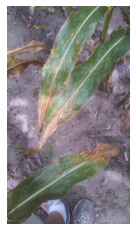

In [ ]:
show_record(train_records[0] , font_size=24 , label_color='#ffff00')

In [ ]:
train_records[1]

BaseRecord

common: 
	- Record ID: lb_blueberry1
	- Filepath: TRAIN/lb_blueberry1.jpg
	- Img: None
	- Image size ImgSize(width=480, height=360)
detection: 
	- BBoxes: [<BBox (xmin:182, ymin:2, xmax:332, ymax:103)>, <BBox (xmin:87, ymin:1, xmax:184, ymax:113)>, <BBox (xmin:5, ymin:1, xmax:111, ymax:112)>, <BBox (xmin:55, ymin:161, xmax:136, ymax:311)>]
	- Class Map: <ClassMap: {'background': 0, 'Bell_pepper leaf spot': 1, 'Potato leaf early blight': 2, 'Strawberry leaf': 3, 'grape leaf': 4, 'grape leaf black rot': 5, 'Tomato leaf': 6, 'Bell_pepper leaf': 7, 'Potato leaf': 8, 'Peach leaf': 9, 'Corn leaf blight': 10, 'Apple Scab Leaf': 11, 'Cherry leaf': 12, 'Tomato leaf bacterial spot': 13, 'Tomato leaf yellow virus': 14, 'Corn Gray leaf spot': 15, 'Apple rust leaf': 16, 'Raspberry leaf': 17, 'Blueberry leaf': 18, 'Squash Powdery mildew leaf': 19, 'Tomato mold leaf': 20, 'Tomato Early blight leaf': 21, 'Tomato leaf late blight': 22, 'Tomato Septoria leaf spot': 23, 'Tomato leaf mosaic vi

In [ ]:
Parser.generate_template(template_record)

class MyParser(Parser):
    def __init__(self, template_record):
        super().__init__(template_record=template_record)
    def __iter__(self) -> Any:
    def __len__(self) -> int:
    def record_id(self, o: Any) -> Hashable:
    def parse_fields(self, o: Any, record: BaseRecord, is_new: bool):
        record.set_filepath(<Union[str, Path]>)
        record.set_img_size(<ImgSize>)
        record.detection.add_bboxes(<Sequence[BBox]>)
        record.detection.set_class_map(<ClassMap>)
        record.detection.add_labels(<Sequence[Hashable]>)


In [ ]:
data_dir =Path(".")

In [ ]:
from torch.utils import data

class PlantDocParser(Parser):
    def __init__(self, template_record, data_dir):
        super().__init__(template_record=template_record)

        self.data_dir = data_dir
        self.df = annot
        self.class_map = class_map

    def __iter__(self) -> Any:
        for o in self.df.itertuples():
            yield o

    def __len__(self) -> int:
        return len(self.df)

    def record_id(self, o) -> Hashable:
        return o.filename

    def parse_fields(self, o, record, is_new):
        if is_new:
            filepath = self.data_dir / 'TRAIN' / o.filename
            record.set_filepath(filepath)
            if filepath.exists():
              image_size = get_img_size(filepath)
              record.set_img_size(image_size) #
            record.detection.set_class_map(self.class_map)

        record.detection.add_bboxes([BBox.from_xyxy(o.xmin, o.ymin, o.xmax, o.ymax)])
        record.detection.add_labels([o.label])

In [ ]:
parser_csv = PlantDocParser(template_record, data_dir)

train_records_csv, valid_records_csv = parser_csv.parse()

  0%|          | 0/8469 [00:00<?, ?it/s]

INFO     - Autofixing records | icevision.parsers.parser:parse:122


  0%|          | 0/2345 [00:00<?, ?it/s]

WARNING  - (record_id: NCLB.jpg) - 🚫 Record could not be autofixed and will be removed because: File 'TRAIN/NCLB.jpg' does not exist | icevision.core.record:autofix_records:104
WARNING  - (record_id: early-blight-1.jpg) - 🚫 Record could not be autofixed and will be removed because: File 'TRAIN/early-blight-1.jpg' does not exist | icevision.core.record:autofix_records:104
AUTOFIX-SUCCESS - (record_id: LB_potato_leaf_topside.jpg) - Clipping bbox xmax from 2354 to image width 2000 (Before: <BBox (xmin:738, ymin:610, xmax:2354, ymax:1679)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: NoCornLeafBlight13b.jpg) - Clipping bbox xmax from 2409 to image width 1944 (Before: <BBox (xmin:321, ymin:731, xmax:2409, ymax:1613)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: NoCornLeafBlight13b.jpg) - Clipping bbox xmax from 1961 to image width 1944 (Before: <BBox (xmin:221, ymin:117, xmax:1961, ymax:879)>) | icevision.utils.logger_utils:aut

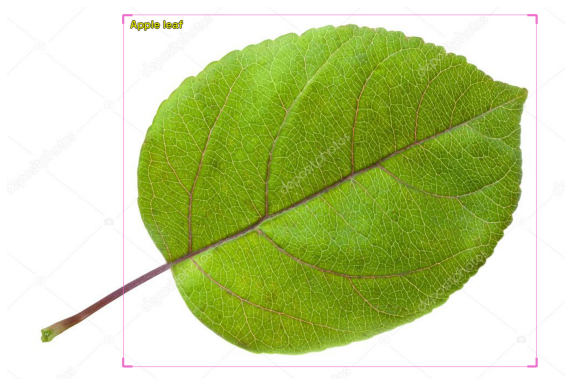

In [ ]:
show_record(train_records_csv[4], class_map=class_map, 
            figsize = (10,10),font_size=20, label_color = '#ffff00')

In [ ]:
train_records_csv[4]

BaseRecord

common: 
	- Filepath: TRAIN/depositphotos_4505396-Green-apple-leaf.jpg
	- Img: None
	- Record ID: depositphotos_4505396-Green-apple-leaf.jpg
	- Image size ImgSize(width=1023, height=682)
detection: 
	- BBoxes: [<BBox (xmin:213, ymin:14, xmax:970, ymax:659)>]
	- Class Map: <ClassMap: {'background': 0, 'Cherry leaf': 1, 'Peach leaf': 2, 'Corn leaf blight': 3, 'Apple rust leaf': 4, 'Potato leaf late blight': 5, 'Strawberry leaf': 6, 'Corn rust leaf': 7, 'Tomato leaf late blight': 8, 'Tomato mold leaf': 9, 'Potato leaf early blight': 10, 'Apple leaf': 11, 'Tomato leaf yellow virus': 12, 'Blueberry leaf': 13, 'Tomato leaf mosaic virus': 14, 'Raspberry leaf': 15, 'Tomato leaf bacterial spot': 16, 'Squash Powdery mildew leaf': 17, 'grape leaf': 18, 'Corn Gray leaf spot': 19, 'Tomato Early blight leaf': 20, 'Apple Scab Leaf': 21, 'Tomato Septoria leaf spot': 22, 'Tomato leaf': 23, 'Soyabean leaf': 24, 'Bell_pepper leaf spot': 25, 'Bell_pepper leaf': 26, 'grape leaf black rot': 27, 

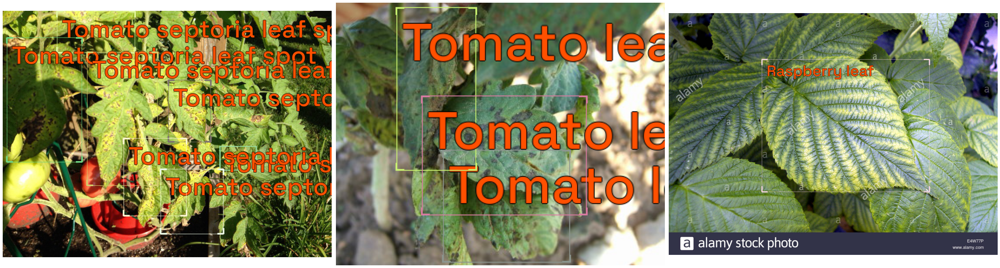

In [ ]:
show_records(train_records_csv[33:36], ncols=3,
             font_size=60, label_color = '#ff5000')

In [ ]:
presize = 512
image_size = 384

train_tfms = tfms.A.Adapter([*tfms.A.aug_tfms(size=image_size, presize=presize), tfms.A.Normalize()])
valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(size=image_size), tfms.A.Normalize()])

In [ ]:
train_ds = Dataset(train_records_csv, train_tfms)
valid_ds = Dataset(valid_records_csv, valid_tfms)

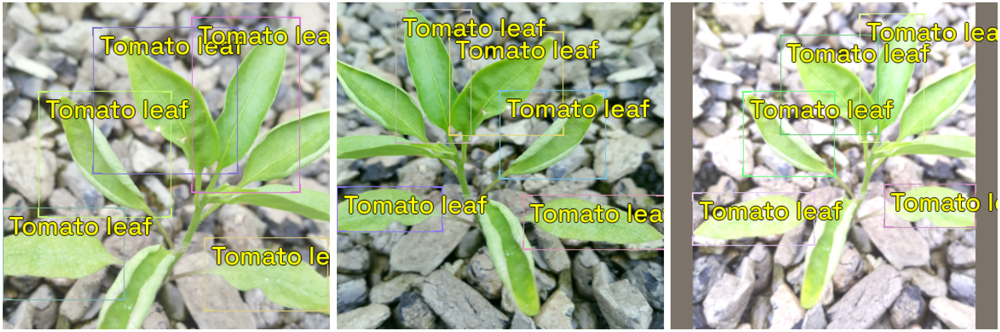

In [ ]:
# visualize transformations
samples = [train_ds[7] for _ in range(3)]
show_samples(samples, ncols=3, font_size=30, label_color = '#ffff00')

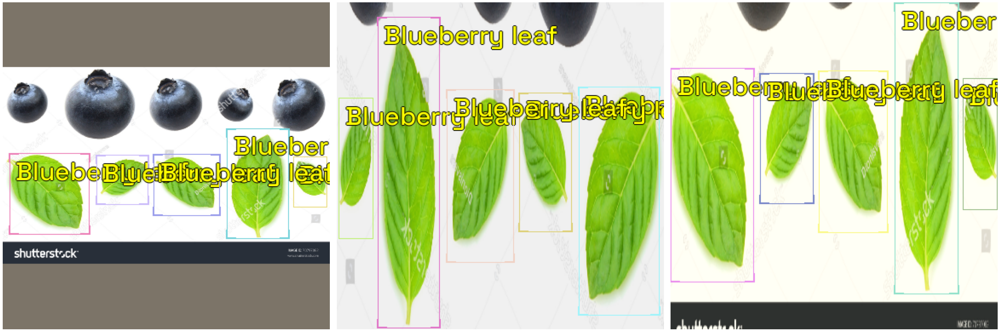

In [ ]:
samples = [train_ds[10] for _ in range(3)]
show_samples(samples, ncols=3, font_size=30, label_color = '#ffff00')

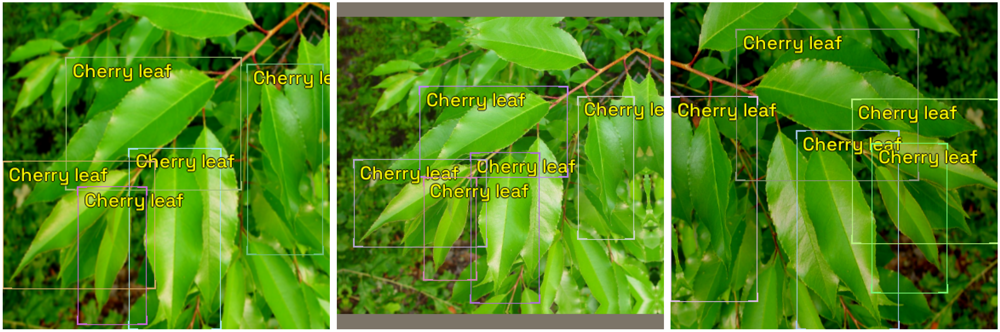

In [ ]:
samples = [train_ds[38] for _ in range(3)]
show_samples(samples, ncols=3, font_size=22, label_color = '#ffff00')

In [ ]:
metrics = [COCOMetric(metric_type=COCOMetricType.bbox)]

  0%|          | 0.00/14.1M [00:00<?, ?B/s]

02/27/2022 12:36:31 - INFO - yolov5.models.yolo -   Overriding model.yaml nc=80 with nc=29
02/27/2022 12:36:31 - INFO - yolov5.models.yolo -   
                 from  n    params  module                                  arguments                     
02/27/2022 12:36:31 - INFO - yolov5.models.yolo -     0                -1  1      3520  yolov5.models.common.Conv               [3, 32, 6, 2, 2]              
02/27/2022 12:36:31 - INFO - yolov5.models.yolo -     1                -1  1     18560  yolov5.models.common.Conv               [32, 64, 3, 2]                
02/27/2022 12:36:31 - INFO - yolov5.models.yolo -     2                -1  1     18816  yolov5.models.common.C3                 [64, 64, 1]                   
02/27/2022 12:36:31 - INFO - yolov5.models.yolo -     3                -1  1     73984  yolov5.models.common.Conv               [64, 128, 3, 2]               
02/27/2022 12:36:31 - INFO - yolov5.models.yolo -     4                -1  2    115712  yolov5.models.common.C3  

SuggestedLRs(valley=0.0012022644514217973)

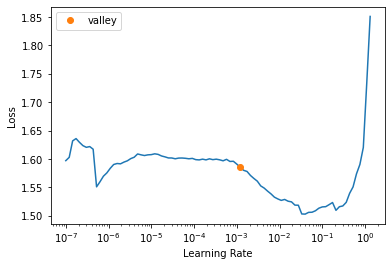

In [ ]:
# using YOLOv5: 1-stage
model_type_yolo = models.ultralytics.yolov5 ##
backbone_yolo = model_type_yolo.backbones.small #
model_yolo = model_type_yolo.model(backbone = backbone_yolo(pretrained=True), ###
                      num_classes=len(parser.class_map),
                      img_size = image_size)#
train_dl_yolo = model_type_yolo.train_dl(train_ds, ##
                      batch_size=16, num_workers=4, shuffle=True)
valid_dl_yolo = model_type_yolo.valid_dl(valid_ds, ##
                      batch_size=16, num_workers=4, shuffle=False)
                                       
learn_yolo = model_type_yolo.fastai.learner(dls=[train_dl_yolo, ###
                                                   valid_dl_yolo], #
                                              model=model_yolo, metrics=metrics)#
learn_yolo.lr_find()#

In [ ]:
learn_yolo.fine_tune(10, 3e-3 , freeze_epochs=1) #

epoch,train_loss,valid_loss,COCOMetric,time
0,1.248021,1.219928,0.018492,02:24


/usr/local/lib/python3.7/dist-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


epoch,train_loss,valid_loss,COCOMetric,time
0,1.035208,1.030441,0.117983,02:26
1,0.928138,0.958883,0.129804,02:24
2,0.888102,0.908928,0.139928,02:24
3,0.831535,0.847539,0.166384,02:29
4,0.796571,0.825862,0.147253,02:25
5,0.769002,0.802799,0.175853,02:25
6,0.718150,0.780512,0.195441,02:27
7,0.699532,0.753685,0.252143,02:24
8,0.672613,0.750973,0.279223,02:24
9,0.668857,0.749834,0.268577,02:22


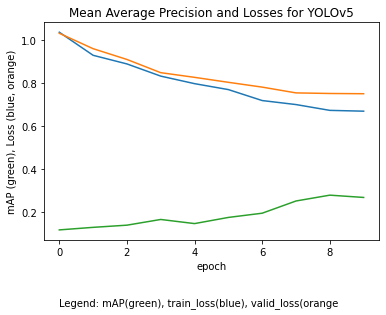

In [ ]:
import matplotlib.pyplot as plt
def plot_metrics(learn, title, x, y):
  plt.plot(L(learn.recorder.values).itemgot())#
  plt.xlabel('epoch')
  plt.ylabel('mAP (green), Loss (blue, orange)')
  plt.title(title)
  plt.text(x, y, 'Legend: mAP(green), train_loss(blue), valid_loss(orange');

plot_metrics(learn_yolo, 'Mean Average Precision and Losses for YOLOv5', 0,-0.23)

>Note: Assuming the presence of a folder called **models** in your Google Drive

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
root_dir = Path('/content/gdrive/My Drive')
fname_model = 'efficenden-yolov5.pth'
torch.save(model_eff.state_dict(), root_dir/fname_model)